
# Car Detector and Classifier


## Table of Contents

1. [Introduction](#intro)
2. [Import Libraries](#import)
3. [Load Object Detection Model](#model)
4. [Define Functions](#functions)
5. [Test Single Dash Cam Image](#test)
6. [Detection Model Performance on all Test Data](#BigTest)
7. [Classify a Single Car Image](#Car)
8. [Putting it all Together](#Together)
9. [Summary](#Summary)


## Introduction<a name = 'intro'>
    
    High performing object detector models are typically trained on very large sets of data and with limited classes. The purpose of this project is to expand the flexibility of an object detection model by detecting an object of interest (in this case a car),cropping the object out of the larger image, and finally feeding the cropped image to a purpose built image classifier. In essence exapanding the number of classes an already trained object detector has.
    
    First, an object detection model with pretained weights is loaded. Then the model is tested on a data set of dash cam images. Next, detected images of cars are cropped and fed into a pretrained image classifier. Finally, the original dash cam image is displayed with bounding boxes and labels of the predicted type of car.


## Import Libraries<a name='import'>

In [34]:
import torch

from PIL import Image, ImageDraw, ImageFont
import colorsys
import random

import imghdr
from keras import backend as K

import numpy as np

import tarfile
import cv2
%matplotlib inline
import matplotlib.pylab as pt
import matplotlib.pyplot as plt
import os



## Load Object Detection Model<a name='model'>

The detection model is the YOLO v5. Documentation can be found at https://github.com/ultralytics/yolov5

Model architecture and pretrained weights are utilized

The model is adjusted so only the class of interest is returned. In this case cars.

In [2]:


# Model
model = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True)



Using cache found in C:\Users\krsim/.cache\torch\hub\ultralytics_yolov5_master
requirements: pandas>=1.1.4 not found and is required by YOLOv5, attempting auto-update...
requirements: Command 'pip install 'pandas>=1.1.4'' returned non-zero exit status 1.
YOLOv5  2022-4-22 torch 1.8.1+cpu CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
Adding AutoShape... 



## Define Functions<a name='functions'>

These functions process the outputs of the detection model 

In [3]:
def get_boxes(preds):
    boxes = []
    for pred in preds:
        box = [pred[1], pred[0], pred[3], pred[2]]
        boxes.append(box)
        
    return(np.array(boxes, dtype = 'uint32'))

def get_box_classes(preds):
    box_classes = []
    for pred in preds:
        box_classes.append(pred[-1])
    classes = np.array(box_classes, dtype = 'uint8')  
    return classes

def read_classes(classes_path):
    with open(classes_path) as f:
        class_names = f.readlines()
    class_names = [c.strip() for c in class_names]
    return class_names

def read_anchors(anchors_path):
    with open(anchors_path) as f:
        anchors = f.readline()
        anchors = [float(x) for x in anchors.split(',')]
        anchors = np.array(anchors).reshape(-1, 2)
    return anchors

def get_colors_for_classes(num_classes):
    """Return list of random colors for number of classes given."""
    # Use previously generated colors if num_classes is the same.
    if (hasattr(get_colors_for_classes, "colors") and
            len(get_colors_for_classes.colors) == num_classes):
        return get_colors_for_classes.colors

    hsv_tuples = [(x / num_classes, 1., 1.) for x in range(num_classes)]
    colors = list(map(lambda x: colorsys.hsv_to_rgb(*x), hsv_tuples))
    colors = list(
        map(lambda x: (int(x[0] * 255), int(x[1] * 255), int(x[2] * 255)),
            colors))
    random.seed(10101)  # Fixed seed for consistent colors across runs.
    random.shuffle(colors)  # Shuffle colors to decorrelate adjacent classes.
    random.seed(None)  # Reset seed to default.
    get_colors_for_classes.colors = colors  # Save colors for future calls.
    return colors


def draw_boxes(image, boxes, box_classes, class_names, labels = "NA", limit_classes = None, scores=None):
    """Draw bounding boxes on image.

    Draw bounding boxes with class name and optional box score on image.

    Args:
        image: An `array` of shape (width, height, 3) with values in [0, 1].
        boxes: An `array` of shape (num_boxes, 4) containing box corners as
            (y_min, x_min, y_max, x_max).
        box_classes: A `list` of indicies into `class_names`.
        class_names: A `list` of `string` class names.
        limit_classes: A `list` of class indices. The function will only out boxes for these classes.
        `scores`: A `list` of scores for each box.

    Returns:
        A copy of `image` modified with given bounding boxes.
    """
    image = Image.fromarray(image)#np.floor(image * 255 + 0.5).astype('uint8'))
    
    #font = ImageFont()
    font = ImageFont.truetype("E:\\A2D2/AovelSansRounded-rdDL.ttf", 22)
    #font = ImageFont.truetype(15)
    thickness = (image.size[0] + image.size[1]) // 400

    colors = get_colors_for_classes(len(class_names))
    
    classes_to_box = [] 
    
    if limit_classes == None:
        classes_to_box = box_classes
    else:
        classes_to_box = limit_classes

    for i, c in list(enumerate(box_classes)):
        box_class = class_names[c]
        if c in classes_to_box:
            box = boxes[i]
            #if isinstance(scores, np.ndarray):
            #    score = scores[i]
            #    label = '{} {:.2f}'.format(box_class, score)
            #else:
            #    label = '{}'.format(box_class)
            
            if labels == "NA":  
                label = labels
            else:
                label = labels[i]
            draw = ImageDraw.Draw(image)
            label_size = draw.textsize(label, font = font)

            top, left, bottom, right = box
            top = max(0, np.floor(top + 0.5).astype('int32'))
            ##left = max(0, np.floor(left + 0.5).astype('int32'))
            #bottom = min(image.size[1], np.floor(bottom + 0.5).astype('int32'))
            #right = min(image.size[0], np.floor(right + 0.5).astype('int32'))
            print(label, (left, top), (right, bottom))
            
            if top - label_size[1] >= 0:
                text_origin =np.array([left, top - label_size[1]])
            else:
                text_origin = np.array((left, top + 1))

            
            for i in range(thickness):
                draw.rectangle(
                    [left + i, top + i, right - i, bottom - i], outline=colors[c])
            draw.rectangle(
                [tuple(text_origin), tuple(text_origin + label_size)],
                fill=colors[c])
            draw.text(tuple(text_origin), label , font=font)
            del draw

    return np.array(image)



In [4]:
class_names = read_classes('E:\\A2D2/coco_c.txt')
anchors = read_anchors("E:\\A2D2/yolo_anchors.txt")
model_image_size = (608, 608)



## Test a Dash Cam Image<a name='test'>
    
    A single image from the A2D2 data set is put into the YOLO model.

In [5]:
dash_cam_files = os.listdir('E:\\A2D2/input_image')

In [6]:
len(dash_cam_files)

12497

In [7]:
dash_cam_filepath = "E:\\A2D2/input_image/"

image_path = (dash_cam_filepath + dash_cam_files[1000])

In [8]:
test_image = Image.open(image_path)

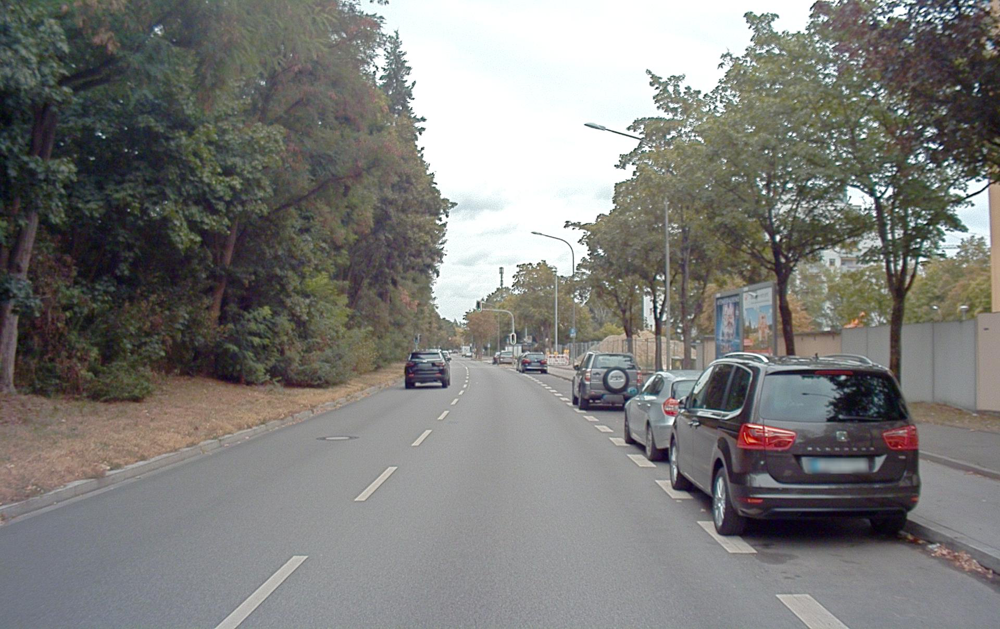

In [9]:
test_image


### Get and display prediction

Now to test whether the detection model will find the cars in the picture 

In [10]:

pred = model(test_image)

In [11]:
boxes = get_boxes(pred.xyxy[0])

In [12]:
#return how many objects detected
(pred.xyxy[0]).shape[0]

7

In [13]:
pred.xyxy[0][0][0:4]

tensor([1279.73840,  674.37317, 1769.26367, 1033.05579])

In [14]:
image = np.array(test_image, dtype = 'uint8')
image.shape

(1208, 1920, 3)

In [15]:
get_box_classes(pred.xyxy[0])

array([2, 2, 2, 2, 2, 2, 2], dtype=uint8)

In [16]:
labels = ["car" for x in range(7) ]
labels

['car', 'car', 'car', 'car', 'car', 'car', 'car']

In [17]:
#Get image with bounding boxes drawn. Limit the type of class to cars (index 2)
output_image = draw_boxes(image, boxes, get_box_classes(pred.xyxy[0]), class_names, labels=labels, limit_classes = [2])

car (1279, 674) (1769, 1033)
car (1197, 707) (1348, 881)
car (777, 672) (866, 746)
car (1095, 668) (1234, 784)
car (995, 675) (1049, 715)
car (946, 670) (989, 701)
car (1103, 683) (1330, 835)


In [18]:
output_image.shape

(1208, 1920, 3)

In [19]:
final = Image.fromarray(output_image)

In [20]:
final.size

(1920, 1208)

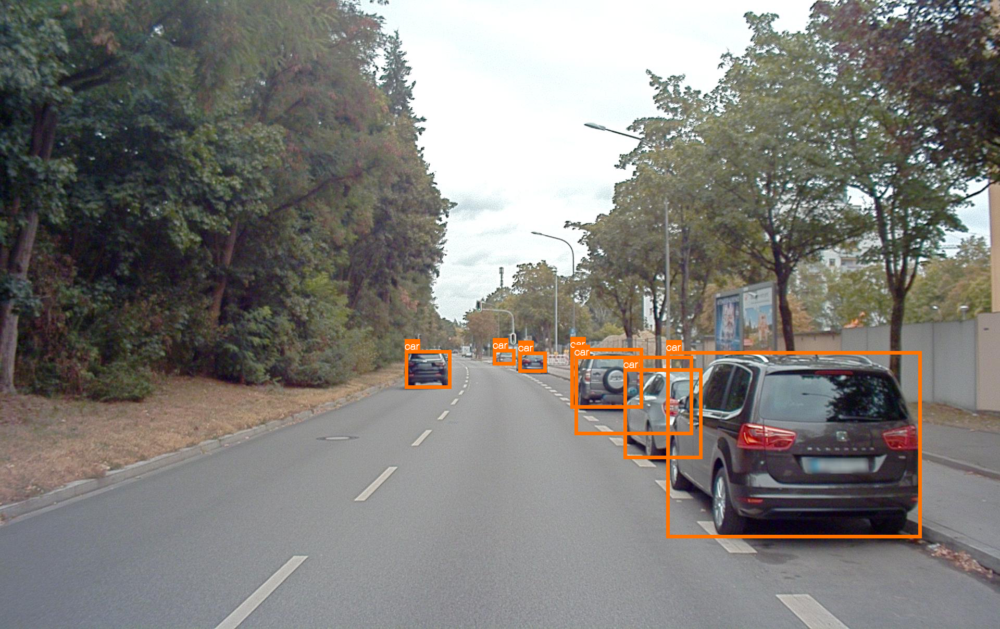

In [21]:
final

**The model does seem to detect the cars in the image. However we can see that it detected one too many cars**


## Test Performance on all test Data<a name='BigTest'>

Now that the model appears to be detecting cars, the model will be tested againt the entire A2D2 dataset. 


In [22]:
import tarfile
import json

In [23]:
#access the A2D2 data
filename = 'camera_lidar_semantic_bboxes.tar'
file_obj = tarfile.open(filename, "r")

In [24]:
#Get the list of image filenames and label filenames
with open("dash_cam_image_file_names.txt", "r") as f1:
    dash_cam_image_file_names = f1.readlines()
    
with open("dash_cam_label_file_names.txt", "r") as f2:
    dash_cam_label_file_names = f2.readlines()


### Functions to measure performance

One of the measures of performance will be the intersection over union (IOU). This compares the predicted bounding box to the labeled bounding box. A value closer to one indicates that the boxes are more similar whereas a value close to zero indicates the boxes are dissimilar. A measure of zero means they are different boxes all together.

In [25]:
def get_label_file_name(image_name):
    #returns the corresponding label file name
    name = image_name.replace("/camera", "/label3D")
    name = name.replace("_camera", "_label3D")
    name = name.replace(".png", ".json")
    return name

def iou(box1, box2):
    """Implement the intersection over union (IoU) between box1 and box2
    
    Arguments:
    box1 -- first box, list object with coordinates (box1_x1, box1_y1, box1_x2, box_1_y2)
    box2 -- second box, list object with coordinates (box2_x1, box2_y1, box2_x2, box2_y2)
    """

    (box1_x1, box1_y1, box1_x2, box1_y2) = box1
    (box2_x1, box2_y1, box2_x2, box2_y2) = box2
    
    # Calculate the (yi1, xi1, yi2, xi2) coordinates of the intersection of box1 and box2. Calculate its Area.
    xi1 = max(box1_x1, box2_x1)
    yi1 = max(box1_y1, box2_y1)
    xi2 = min(box1_x2, box2_x2)
    yi2 = min(box1_y2, box2_y2)
    inter_width = max(xi2 - xi1, 0)
    inter_height = max(yi2 - yi1, 0)
    inter_area = inter_width * inter_height
    
    # Calculate the Union area by using Formula: Union(A,B) = A + B - Inter(A,B)
    box1_area = (box1_x2 - box1_x1) * (box1_y2 - box1_y1)
    box2_area = (box2_x2 - box2_x1) * (box2_y2 - box2_y1)
    union_area = box1_area + box2_area - inter_area
    
    # compute the IoU
    iou = inter_area / union_area
    
    return iou

def match_boxes(box_list_1, box_list_2):
    """Find a one to one match of most similar boxes based on location
    
    Arguments:
    box_list_1 -- known list of list object with coordinates (boxi_x1, boxi_y1, boxi_x2, boxi_y2)
    box_list 2 -- predicted list of list object with coordinates (boxj_x1, boxj_y1, boxj_x2, boxj_y2)
    """
    def sort_horiz(array):
        boxes = array
        temp = []
        for box in boxes:
            temp.append(box[0])
            
        temp.sort()
        new_array = []
        
        for num in temp:
            for box in boxes:
                if np.any(box[0] == num):
                    new_array.append(box)
                    boxes.remove(box)
                    
        return new_array
    
    def sort_vert(array):
        boxes = array
        temp = []
        for box in boxes:
            temp.append(box[1])
            
        temp.sort()
        new_array = []
        
        for num in temp:
            for box in boxes:
                if np.any(box[1] == num):
                    new_array.append(box)
                    boxes.remove(box)
                    
        return new_array
    
    list_1 = sort_horiz(box_list_1)
    list_1 = sort_vert(list_1)
    
    list_2 = sort_vert(box_list_2)
    list_2 = sort_horiz(list_2)
            
    return zip(list_1, list_2)    
    
def iou_scores(test_image):
    """Calculates the intersection over union (IoU) for the test_image's given bounding boxes
    and the predicted bounding boxes
        
    Arguments:
    test_image -- test image file name
    """
    
    image = file_obj.extractfile(test_image)
    label_json = json.load(file_obj.extractfile(get_label_file_name(test_image)))
    
    known_boxes = []
    
    for key in label_json.keys():
        if label_json[key]['class'] in ['Car', 'VanSUV']:
            known_boxes.append(label_json[key]['2d_bbox'])
    
    image = Image.open(file_obj.extractfile(test_image))
    
    pred = model(image)
    prediction = np.array(pred.xyxy[0])
    
    image.close()
    
    pred_boxes = []
    pred_probs = []
    
    for i in prediction:
        if i[-1] == 2:
            pred_boxes.append(i[:4].tolist())
            pred_probs.append(i[4])
            
    num_known, num_pred = len(known_boxes), len(pred_boxes)
    
    if num_known == num_pred:
        temp = list(match_boxes(known_boxes, pred_boxes))
        scores = [iou(bb_box[0], bb_box[1]) for bb_box in temp]
        return scores, num_known, num_pred
    
    elif num_known < num_pred:
        all_scores = []
        scores = [0 for x in range(num_pred - num_known)]
        for i in pred_boxes:
            for j in known_boxes:
                all_scores.append(iou(i, j))
        for score in sorted(all_scores)[-(num_pred-num_known+1):]:
            scores.append(score)
        return scores, num_known, num_pred
    
    else:
        all_scores = []
        scores = []
        for i in pred_boxes:
            for j in known_boxes:
                all_scores.append(iou(i, j))
        for score in sorted(all_scores)[-(num_pred):]:
            scores.append(score)
        return scores, num_known, num_pred
    
   
        


### Examine all test images

Now we iterate through all the dash cam images. For each image:

- The YOLO model makes a prediction for the location and size of bounding box for each car in the image
- The number of bounding boxes predicted is recorded
- The number of labeled bounding boxes is recorded
- The boxes predicted are matched with the most likely labeled box
- The IOU score is calculated and recorded for each match

In [44]:
all_scores = []
all_num_know = []
all_num_pred = []
for i in dash_cam_image_file_names:
    scores, num_known, num_pred = iou_scores(i[:-1])
    all_scores.append(scores)
    all_num_know.append(num_known)
    all_num_pred.append(num_pred)

In [ ]:
len(all_scores)

**Save the results**

In [26]:
import pickle

#with open("iou-scores", "wb") as fp:   #Pickling
    #pickle.dump(all_scores, fp)
    
#with open("num-known", "wb") as fp:   #Pickling
    #pickle.dump(all_num_know, fp)
    
#with open("num-pred", "wb") as fp:   #Pickling
    #pickle.dump(all_num_pred, fp)

with open("iou-scores", "rb") as fp:   # Unpickling
    all_scores = pickle.load(fp)

with open("num-known", "rb") as fp:   # Unpickling
    all_num_known = pickle.load(fp)

with open("num-pred", "rb") as fp:   # Unpickling
    all_num_pred = pickle.load(fp)


### Analysis

In [27]:
import pandas as pd

bb_dict = {"Boxes_Known":all_num_known, "Boxes_Predicted": all_num_pred}
bb_df = pd.DataFrame(bb_dict)

In [28]:
bb_df.head()

,Boxes_Known,Boxes_Predicted
0,0,0
1,0,0
2,1,2
3,2,7
4,0,1


In [29]:
bb_df["Pred_Minus_Known"] = bb_df.Boxes_Predicted - bb_df.Boxes_Known

In [30]:
bb_df.head()

,Boxes_Known,Boxes_Predicted,Pred_Minus_Known
0,0,0,0
1,0,0,0
2,1,2,1
3,2,7,5
4,0,1,1


In [31]:
bb_df.describe()

,Boxes_Known,Boxes_Predicted,Pred_Minus_Known
count,12497.000000,12497.000000,12497.000000
mean,2.168280,5.618548,3.450268
std,2.167799,4.446587,3.374740
min,0.000000,0.000000,-4.000000
25%,1.000000,2.000000,1.000000
50%,1.000000,5.000000,3.000000
75%,3.000000,8.000000,5.000000
max,17.000000,29.000000,24.000000


We can see that the YOLO model, on average, predicts more cars than are labeled. This can easily be explained by looking at what cars are labeled. The labeled data set only lists the cars in the image that are not too distant or too partially obscured. The YOLO model however will capture anything that it thinks might be part of a car.

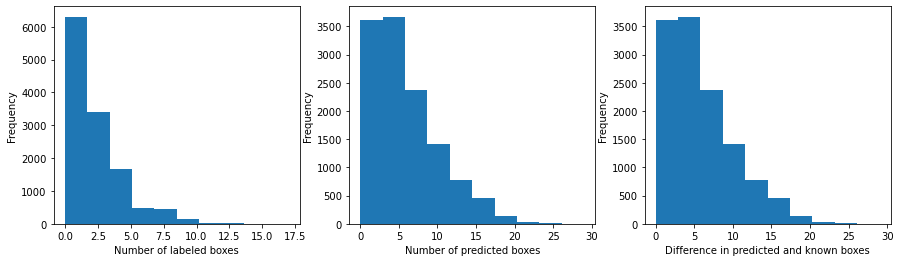

In [35]:
fig = plt.figure()
ax1 = fig.add_subplot(1, 3, 1)
ax2 = fig.add_subplot(1, 3, 2)
ax3 = fig.add_subplot(1, 3, 3)

n, bins, patches = ax1.hist(bb_df.Boxes_Known)
ax1.set_xlabel('Number of labeled boxes')
ax1.set_ylabel('Frequency')

n, bins, patches = ax2.hist(bb_df.Boxes_Predicted)
ax2.set_xlabel('Number of predicted boxes')
ax2.set_ylabel('Frequency')

n, bins, patches = ax3.hist(bb_df.Boxes_Predicted)
ax3.set_xlabel('Difference in predicted and known boxes')
ax3.set_ylabel('Frequency')

fig.set_figwidth(15)

In [40]:
#flatten all scores list
flat_all_scores = [item for sublist in all_scores for item in sublist]

(array([      65205,        3440,        2631,        1854,        1749,        2184,        3478,        5418,        4710,        1095]),
 array([          0,    0.098855,     0.19771,     0.29656,     0.39542,     0.49427,     0.59313,     0.69198,     0.79084,     0.88969,     0.98855]),
 <BarContainer object of 10 artists>)

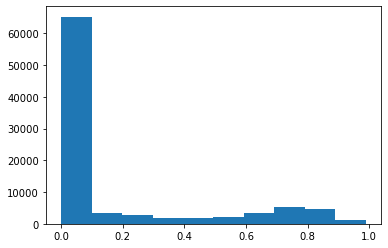

In [41]:
plt.hist(flat_all_scores, bins = 10)

Remove all zero scores. These represent boxes that do not overlap at all.

In [42]:

flat_all_scores_nonnegative = list(filter((0).__ne__, flat_all_scores))

(array([      21695,        3440,        2631,        1854,        1749,        2184,        3478,        5418,        4710,        1095]),
 array([          0,    0.098855,     0.19771,     0.29656,     0.39542,     0.49427,     0.59313,     0.69198,     0.79084,     0.88969,     0.98855]),
 <BarContainer object of 10 artists>)

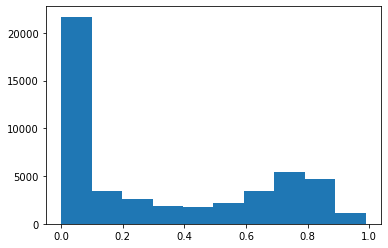

In [43]:
plt.hist(flat_all_scores_nonnegative, bins = 10)

The results appear to show that the predicted bounding boxes and labeled bounding boxes may not be matched up correctly. The IOU score is very high or very low indicating that the bounding boxes are nearly identical or barely overlapping. The detection does seem to be working well and the issue is likely coming from the way the IOU score iterates through the bounding boxes.


## Classify a Single Car Image<a name='Car'>


### Crop car from image to classify

Crop one of the predictions from the original test image

In [93]:
car = test_image.crop(np.array(pred.xyxy[0][0][0:4], dtype='uint32'))

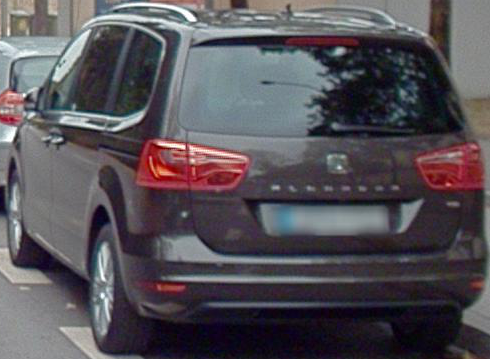

In [87]:
car

In [88]:
car.size

(490, 359)

In [89]:
car = car.save("E:\\A2D2/test_image.jpg")


### Feed Cropped Image into Classifier

A seperately trained car clasification model has been trained and then loaded here. The cropped car image will be resized and run through the clasifier.

In [90]:
import tensorflow as tf
from tensorflow import keras

car_model = keras.models.load_model("E:\\A2D2/InceptionNetCar.h5")

In [91]:
#function to prepare image for classification

def prepare_image(car_image):
    image = tf.image.resize(car_image, size=(224, 224))
    image = tf.cast(image, tf.float32) / 255.0
    return image
    
def make_square(im, min_size=256, fill_color=(0, 0, 0)):
    x, y = im.size
    size = max(min_size, x, y)
    new_im = Image.new('RGB', (size, size))
    new_im.paste(im, (int((size-x)/2), int((size-y)/2)))
    
    return new_im

The classifer requires a sqwuare image. So the cropped image is padded to make it square.

In [94]:
square_car = make_square(car, fill_color = (255, 255, 255))

In [95]:
square_car.size

(490, 490)

The new square image is prepared for the classifier.

In [96]:
im = prepare_image(np.array(square_car))

In [97]:
im.shape

TensorShape([224, 224, 3])

In [98]:
im = np.expand_dims(im, axis = 0)

In [99]:
im.shape

(1, 224, 224, 3)

The classifier returns its prediction for the car make.

In [100]:
pred = car_model.predict(im)

In [101]:
class_pred = np.argmax(pred)

In [108]:
class_pred

8

In [106]:
with open ("car_make_classes", "rb") as f:
    CLASSES = pickle.load(f)
CLASSES = list(CLASSES)

In [107]:
CLASSES[class_pred]

'Infiniti'

## Putting it All Together<a name='Together'>
    
    Finally, a function is defined that combines both models and outputs the original image with bounding boxes and 
    predicted labels

In [147]:
def detector_classifier(detector_model, classifier_model, image):
    """Detect occurance of a particular object in an image then crop out the object to classify.
    
    Arguments:
    
    detection_model -- object detection model
    classifier_model -- image classification model
    image -- image to search
    """
    pred = detector_model(image)
    boxes = get_boxes(pred.xyxy[0])
    #image = np.array(image, dtype = 'uint8')
    pred_labels=[]
    
    for i in range(len(pred.xyxy[0])):
        car = image.crop(np.array(pred.xyxy[0][i][0:4], dtype='uint32'))
        square_car = make_square(car, fill_color = (255, 255, 255))
        im = prepare_image(np.array(square_car))
        im = np.expand_dims(im, axis = 0)
    
        preds = classifier_model.predict(im)
        class_pred = np.argmax(preds)
        pred_labels.append(CLASSES[class_pred])
        
    image = np.array(image, dtype = 'uint8')
    output_image = draw_boxes(image, boxes, get_box_classes(pred.xyxy[0]), class_names, labels = pred_labels, limit_classes = [2])
    
    return output_image

In [148]:
output_image = detector_classifier(model, car_model, test_image)

Infiniti (1279, 674) (1769, 1033)
Suzuki (1197, 707) (1348, 881)
Suzuki (777, 672) (866, 746)
Smart (1095, 668) (1234, 784)
Isuzu (995, 675) (1049, 715)
Isuzu (946, 670) (989, 701)
Suzuki (1103, 683) (1330, 835)


In [149]:
output_image = Image.fromarray(output_image)

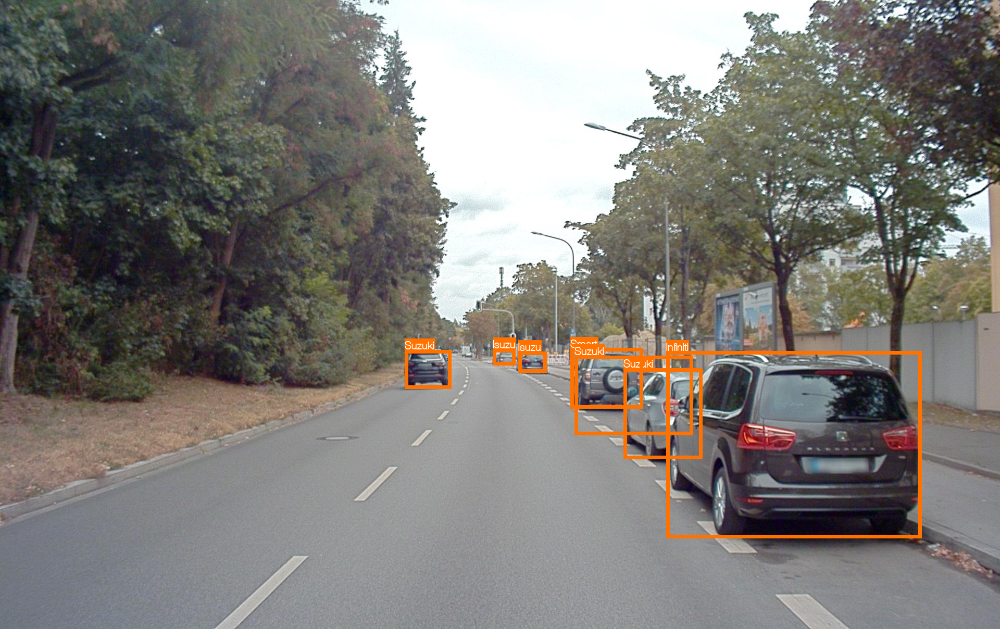

In [150]:
output_image


## Final Summary

The detector/classifier does operate as expected.However, although the detection phase seems to perform well, the classification phase does not. During the classification training phase, the accuracy was only 8%. This is undoubtedly due to the limited amount of training data used. Additional work needs to be performed to improve the classification model. On the plus side, once the new and improved model is trained, it is a simple matter of uploading the weights to the detector/classifier. Furthermore, a different object can be selected ,other than "car", from the YOLO model and a purpose built classifier simply input into the detector/classifier function.

